# Exemplo de usos - Lime

## Implementando uma forma simples 

In [466]:
import numpy as np
from sklearn.linear_model import LogisticRegression
import matplotlib.pyplot as plt

class LimeExplainer:
    def __init__(self, kernel_width=0.2):
        self.kernel_width = kernel_width
    
    # Define a função de kernel e a distância entre xi e X_lime
    def kernel_fn(self, xi, X_lime):
        distances = np.sum((xi - X_lime)**2, axis=1)  # Distância euclidiana
        weights = np.sqrt(np.exp(-(distances**2) / (self.kernel_width**2)))  # Kernel gaussiano
        return weights
    
    # Gera os dados ao redor de xi
    def generate_data(self, xi, num_samples, num_features):
        # Cria os dados com o mesmo número de features que xi
        X_lime = np.random.normal(0, 1, size=(num_samples,xi.shape[0]))
        # Zera alguns valores e deixa apenas num_features valores diferentes de zero
        for i in range(num_samples):
            zero_indices = np.random.choice(xi.shape[0], xi.shape[0] - num_features, replace=False)
            X_lime[i, zero_indices] = 0
        return X_lime

    # Explica uma instância xi
    def explain_instance(self, xi, num_samples, num_features, model):
        # Gera os dados ao redor de xi
        X_lime = self.generate_data(xi, num_samples, num_features)
        # Calcula a predição para esses dados
        y_lime = model.predict(X_lime)
        # Calcula os pesos para cada dado
        weights = self.kernel_fn(xi, X_lime)
        # Ajusta um modelo linear simples
        simpler_model = LogisticRegression()
        simpler_model.fit(X_lime, y_lime, sample_weight=weights)
        return X_lime, y_lime,weights, simpler_model.coef_




### Exemplo de uso

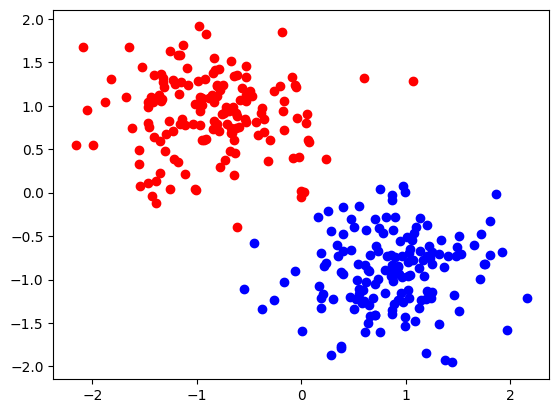

In [467]:
# Gerando dados
import sklearn
from sklearn.datasets import make_blobs
from sklearn.model_selection import train_test_split
X, y = make_blobs(n_samples=300, centers=2, n_features=2, random_state=33)

# Normalizando os dados
X = (X - np.mean(X, axis=0)) / np.std(X, axis=0)

# Separando os dados
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Plotando os dados
plt.scatter(X[y==0][:,0], X[y==0][:,1], color='red')
plt.scatter(X[y==1][:,0], X[y==1][:,1], color='blue')
plt.show()


In [468]:
# Ajustando em um modelo caixa preta
model = sklearn.neural_network.MLPClassifier(hidden_layer_sizes=(10,10), max_iter=1000)
model.fit(X_train, y_train)

# Avaliando o modelo
y_pred = model.predict(X_test)
print("Acurácia:", sklearn.metrics.accuracy_score(y_test, y_pred))

Acurácia: 1.0


Instância: [ 0.2  -0.05]
Classe real: 1


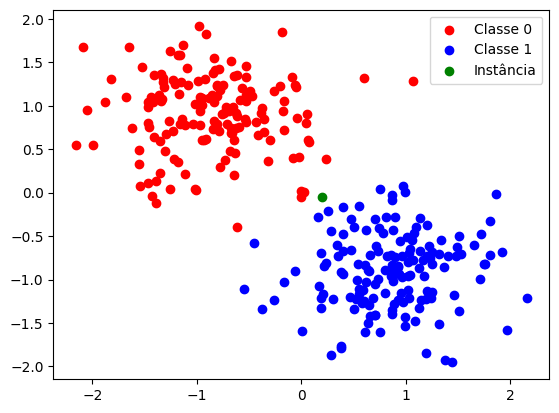

In [469]:
# Explicando uma instância 
xi = np.array([0.2,-0.05])
print("Instância:", xi)
print("Classe real:", model.predict([xi])[0])

# Mostrando a instância
plt.scatter(X[y==0][:,0], X[y==0][:,1], color='red')
plt.scatter(X[y==1][:,0], X[y==1][:,1], color='blue')
plt.scatter(xi[0], xi[1], color='green')
plt.legend(["Classe 0", "Classe 1", "Instância"])
plt.show()


In [470]:
# Explicando a instância 
explainer = LimeExplainer()
X_lime, y_lime, weights, coef = explainer.explain_instance(xi, 1000, 2, model)


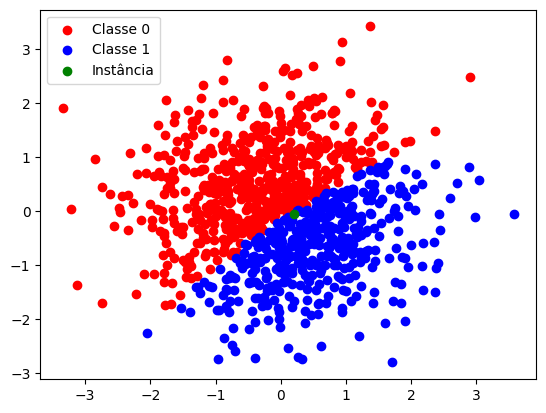

In [471]:
# Plota X_lime e y_lime
plt.scatter(X_lime[y_lime==0][:,0], X_lime[y_lime==0][:,1], color='red')
plt.scatter(X_lime[y_lime==1][:,0], X_lime[y_lime==1][:,1], color='blue')
plt.scatter(xi[0], xi[1], color='green')
plt.legend(["Classe 0", "Classe 1", "Instância"])
plt.show()

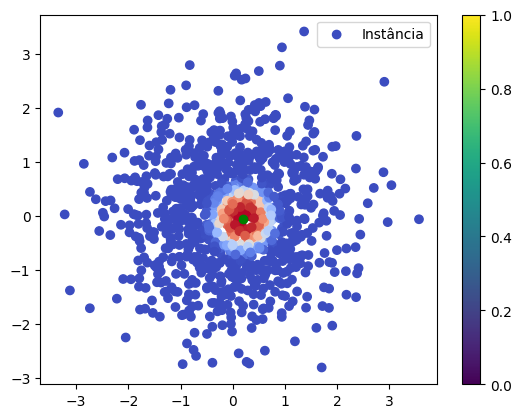

In [472]:
# Plota os pesos
plt.scatter(X_lime[:,0], X_lime[:,1], c=weights, cmap='coolwarm')
plt.scatter(xi[0], xi[1], color='green')
plt.colorbar()
plt.legend(["Instância"])
plt.show()

In [473]:
# Coeficientes do modelo linear
print("Coeficientes:", coef)


Coeficientes: [[ 3.062778   -3.98169628]]


### Explicações

Nesse exemplo simples podemos ver o funcionamento do LIME em cada uma de suas etapas. Geramos e treinamos os dados com uma rede neural e escolhemos propositalmente uma instância na fronteira entre as duas classes para ver se o modelo funciona corretamente. Ao gerar as perturbações podemos ver que suas classificações estão de acordo com o modelo gerador de dados original e também podemos observar que os pesos atribuidos a elas é maior quanto mais próximo das instâncias.
O resultado final que queremos analisar é o coeficiente, o primeiro é positivo, o que significa que quando x1 aumenta, a probabilidade de pertencer a classe 1 aumenta, o segundo coeficiente é negativo, isso significa que quando x2 aumenta, a probabilidade de pertencer a classe 1 diminui. Vejamos outro exemplo na instância (1,-1) ambos os coeficientes são aproximadamente nulos, pois na proximidade da nova instância nenhuma feature influencia significativamente na classificação.

Instância: [ 1 -1]
Classe real: 1


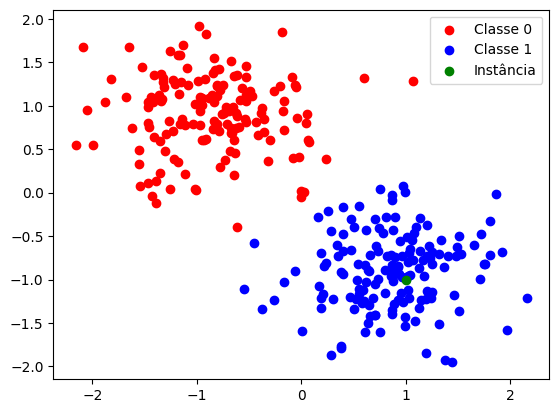

Coeficientes: [[-6.24844435e-06 -4.01024538e-05]]


In [474]:
# Explicando uma instância 
xi = np.array([1,-1])
print("Instância:", xi)
print("Classe real:", model.predict([xi])[0])

# Mostrando a instância
plt.scatter(X[y==0][:,0], X[y==0][:,1], color='red')
plt.scatter(X[y==1][:,0], X[y==1][:,1], color='blue')
plt.scatter(xi[0], xi[1], color='green')
plt.legend(["Classe 0", "Classe 1", "Instância"])
plt.show()

lime = LimeExplainer()
X_lime, y_lime, weights, coef = lime.explain_instance(xi, 1000, 2, model)
print("Coeficientes:", coef)



## Análise do modelo original

In [475]:
# Importar bibliotecas
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.neural_network import MLPClassifier
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords

# Explicador LIME
import lime
import lime.lime_text
from sklearn.pipeline import make_pipeline
from lime.lime_text import LimeTextExplainer



[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Lavin\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [476]:
# Exemplo de conjunto de dados de resenhas
dados = pd.read_csv('dados.csv', sep=';')

# Separar as features e o alvo
X = dados['review']
y = dados['sentimentos']

Instância a ser analisada

In [477]:
# Escolher uma instância para fazer a previsão
instance_index = 15
instance = X.iloc[instance_index]
instance_label = y.iloc[instance_index]
print('Instância:', instance)
print('Rótulo:', instance_label)

Instância: Nunca vi algo tão ruim na minha vida. A produção foi amadora e a história, entediante.
Rótulo: 0


Faremos uma análise com e sem stop-words

In [478]:
# Retirar stop-words
stop_words = stopwords.words('portuguese')
X_sw = X.apply(lambda x: ' '.join([word for word in x.split() if word not in (stop_words)]))

# Vetorização do texto
vectorizer_sw = TfidfVectorizer()
X_vectorized_sw = vectorizer_sw.fit_transform(X_sw)

# Dividir os dados em conjuntos de treino e teste
X_train_sw, X_test_sw, y_train, y_test = train_test_split(X_vectorized_sw, y, test_size=0.2, random_state=42)

In [479]:
# Deixar stopwords
vectorizer = TfidfVectorizer()
X_vectorized = vectorizer.fit_transform(X)

# Dividir os dados em conjuntos de treino e teste
X_train, X_test, y_train, y_test = train_test_split(X_vectorized, y, test_size=0.2, random_state=42)

### Random Forest

Sem stop-words

In [480]:
# Treinamento do modelo de floresta aleatória
model_rf_sw = RandomForestClassifier(random_state=42)
model_rf_sw.fit(X_train_sw, y_train)

# Predição e avaliação do modelo
y_pred_rf_sw = model_rf_sw.predict(X_test_sw)

# Acurácia e métricas
print('Acurácia do modelo de floresta aleatória sem stopwords:', accuracy_score(y_test, y_pred_rf_sw))
print(classification_report(y_test, y_pred_rf_sw))



Acurácia do modelo de floresta aleatória sem stopwords: 0.95
              precision    recall  f1-score   support

           0       0.86      1.00      0.92         6
           1       1.00      0.93      0.96        14

    accuracy                           0.95        20
   macro avg       0.93      0.96      0.94        20
weighted avg       0.96      0.95      0.95        20



Com stop-words

In [481]:
# Treinamento do modelo de floresta aleatória
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Fazer previsões com o modelo de floresta aleatória
rf_y_pred = rf_model.predict(X_test)

# Avaliar o modelo de floresta aleatória
print(f'Random Forest Accuracy: {accuracy_score(y_test, rf_y_pred)}')
print(classification_report(y_test, rf_y_pred))

Random Forest Accuracy: 0.95
              precision    recall  f1-score   support

           0       0.86      1.00      0.92         6
           1       1.00      0.93      0.96        14

    accuracy                           0.95        20
   macro avg       0.93      0.96      0.94        20
weighted avg       0.96      0.95      0.95        20



In [482]:
# SEM STOPWORDS
pipeline_rf_sw = make_pipeline(vectorizer_sw, model_rf_sw)
explainer_rf_sw = LimeTextExplainer(class_names=['negativo', 'positivo'])
exp_rf_sw = explainer_rf_sw.explain_instance(instance, pipeline_rf_sw.predict_proba, num_features=3)

# Mostrar a explicação
exp_rf_sw.show_in_notebook(text=True)



In [483]:
# COM STOPWORDS
pipeline_rf = make_pipeline(vectorizer, rf_model)
explainer_rf = LimeTextExplainer(class_names=['negativo', 'positivo'])
exp_rf = explainer_rf.explain_instance(instance, pipeline_rf.predict_proba, num_features=3)

# Mostrar a explicação
exp_rf.show_in_notebook(text=True)


### Multi-layer Perceptron

Sem stop-words

In [484]:
# Treinamento do modelo de rede neural
nn_model_sw = MLPClassifier(hidden_layer_sizes=(100, 100), max_iter=1000, random_state=42)
nn_model_sw.fit(X_train_sw, y_train)

# Fazer previsões com o modelo de rede neural
y_pred_nn_sw = nn_model_sw.predict(X_test_sw)

# Avaliar o modelo de rede neural
print('Acurácia do modelo de rede neural sem stopwords:', accuracy_score(y_test, y_pred_nn_sw))
print(classification_report(y_test, y_pred_nn_sw))



Acurácia do modelo de rede neural sem stopwords: 0.9
              precision    recall  f1-score   support

           0       0.75      1.00      0.86         6
           1       1.00      0.86      0.92        14

    accuracy                           0.90        20
   macro avg       0.88      0.93      0.89        20
weighted avg       0.93      0.90      0.90        20



Com stop-words

In [485]:

# Treinamento do modelo de rede neural
nn_model = MLPClassifier(hidden_layer_sizes=(100, 100), max_iter=1000, random_state=42)
nn_model.fit(X_train, y_train)

# Fazer previsões com o modelo de rede neural
nn_y_pred = nn_model.predict(X_test)

# Avaliar o modelo de rede neural
print(f'Neural Network Accuracy: {accuracy_score(y_test, nn_y_pred)}')
print(classification_report(y_test, nn_y_pred))


Neural Network Accuracy: 0.95
              precision    recall  f1-score   support

           0       0.86      1.00      0.92         6
           1       1.00      0.93      0.96        14

    accuracy                           0.95        20
   macro avg       0.93      0.96      0.94        20
weighted avg       0.96      0.95      0.95        20



In [486]:
# Pipeline para o modelo de rede neural sem stopwords
pipeline_nn_sw = make_pipeline(vectorizer_sw, nn_model_sw)
explainer_nn_sw = LimeTextExplainer(class_names=['negativo', 'positivo'])
exp_nn_sw = explainer_nn_sw.explain_instance(instance, pipeline_nn_sw.predict_proba, num_features=3)

# Mostrar a explicação
exp_nn_sw.show_in_notebook(text=True)

In [487]:
# Pipeline para o modelo de rede neural
pipeline_nn = make_pipeline(vectorizer, nn_model)
explainer_nn = LimeTextExplainer(class_names=['negativo', 'positivo'])
exp_nn = explainer_nn.explain_instance(instance, pipeline_nn.predict_proba, num_features=3)

# Mostrar a explicação
exp_nn.show_in_notebook(text=True)

### Gradient Boosting

Sem stop-words

In [488]:
# Treinamento do modelo de Gradient Boosting
gb_model_sw = GradientBoostingClassifier(random_state=42)
gb_model_sw.fit(X_train_sw, y_train)

# Fazer previsões com o modelo de Gradient Boosting
y_pred_gb_sw = gb_model_sw.predict(X_test_sw)

# Avaliar o modelo de Gradient Boosting
print('Acurácia do modelo de Gradient Boosting sem stopwords:', accuracy_score(y_test, y_pred_gb_sw))
print(classification_report(y_test, y_pred_gb_sw))


Acurácia do modelo de Gradient Boosting sem stopwords: 0.95
              precision    recall  f1-score   support

           0       0.86      1.00      0.92         6
           1       1.00      0.93      0.96        14

    accuracy                           0.95        20
   macro avg       0.93      0.96      0.94        20
weighted avg       0.96      0.95      0.95        20



Com stop-words

In [489]:
# Treinamento do modelo de Gradient Boosting
gb_model = GradientBoostingClassifier(n_estimators=100, random_state=42)
gb_model.fit(X_train, y_train)

# Fazer previsões com o modelo de Gradient Boosting
gb_y_pred = gb_model.predict(X_test)

# Avaliar o modelo de Gradient Boosting
print(f'Gradient Boosting Accuracy: {accuracy_score(y_test, gb_y_pred)}')
print(classification_report(y_test, gb_y_pred))

Gradient Boosting Accuracy: 0.95
              precision    recall  f1-score   support

           0       0.86      1.00      0.92         6
           1       1.00      0.93      0.96        14

    accuracy                           0.95        20
   macro avg       0.93      0.96      0.94        20
weighted avg       0.96      0.95      0.95        20



In [490]:
# Pipeline para o modelo de Gradient Boosting sem stopwords
pipeline_gb_sw = make_pipeline(vectorizer_sw, gb_model_sw)
explainer_gb_sw = LimeTextExplainer(class_names=['negativo', 'positivo'])
exp_gb_sw = explainer_gb_sw.explain_instance(instance, pipeline_gb_sw.predict_proba, num_features=3)

# Mostrar a explicação
exp_gb_sw.show_in_notebook(text=True)


In [491]:
# Pipeline para o modelo de Gradient Boosting
pipeline_gb = make_pipeline(vectorizer, gb_model)
explainer_gb = LimeTextExplainer(class_names=['negativo', 'positivo'])
exp_gb = explainer_gb.explain_instance(instance, pipeline_gb.predict_proba, num_features=3)

# Mostrar a explicação
exp_gb.show_in_notebook(text=True)

### Análise:

Treinamos 3 modelos, com e sem stop words, e obtivemos suas explicações. É possível analisar algumas características interessantes desse experimento:

- O lime é útil para verificar qual modelo é mais adequado: 
Todos os modelos analisados possuem acurácia similar, com exceção do MLP sem stop words que possui acurácia mais baixa, portanto, uma forma de decidir entre eles é ver suas explicações. Note que o random forest não retorna boa explicações, assim como o MLP sem stop-words, portanto, em um impasse em escolher entre os 3 modelos o gradient boost retorna resultados melhores.

- O lime é sensível a pequenas mudanças:
Era esperado que as palavras significativas com maiores pesos em uma frase fossem a mesma se o modelo é treinado com ou sem stop words, mas isso não ocorre. Veja o gradient boost, por exemplo, a segunda e terceira palavras mais importantes mudam na análise com e sem stop words mesmo sendo significativas em ambas, isso demonstra certa instabilidade do lime.